In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2012_to_2014.csv
/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2009_to_2011.csv
/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2005_to_2007.csv
/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accident_coords_update.ipynb
/kaggle/input/2000-16-traffic-flow-england-scotland-wales/ukTrafficAADF.csv
/kaggle/input/2000-16-traffic-flow-england-scotland-wales/Areas.shp
/kaggle/input/2000-16-traffic-flow-england-scotland-wales/Local_Authority_Districts_Dec_2016.geojson


<h2>Load datasets</h2

In [2]:

# Load datasets
df_2005_to_2007 = pd.read_csv('/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2005_to_2007.csv')
df_2009_to_2011 = pd.read_csv('/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2009_to_2011.csv')
df_2012_to_2014 = pd.read_csv('/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2012_to_2014.csv')


# Combine datasets
combined_df = pd.concat([df_2005_to_2007, df_2009_to_2011, df_2012_to_2014], ignore_index=True )


/tmp/ipykernel_47/3807762445.py:2: DtypeWarning: Columns (31) have mixed types. Specify dtype option on import or set low_memory=False.
  df_2005_to_2007 = pd.read_csv('/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2005_to_2007.csv')
/tmp/ipykernel_47/3807762445.py:4: DtypeWarning: Columns (31) have mixed types. Specify dtype option on import or set low_memory=False.
  df_2012_to_2014 = pd.read_csv('/kaggle/input/2000-16-traffic-flow-england-scotland-wales/accidents_2012_to_2014.csv')


<h2>Exploring Dataset</h2>

In [3]:
import pandas_profiling 
combined_df.profile_report()

/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:
/tmp/ipykernel_47/177437933.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling`

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
# Calculate the percentage of null values for each column
null_percentages = combined_df.isnull().mean() * 100
null_percentages

Accident_Index                                   0.000000
Location_Easting_OSGR                            0.006715
Location_Northing_OSGR                           0.006715
Longitude                                        0.006715
Latitude                                         0.006715
Police_Force                                     0.000000
Accident_Severity                                0.000000
Number_of_Vehicles                               0.000000
Number_of_Casualties                             0.000000
Date                                             0.000000
Day_of_Week                                      0.000000
Time                                             0.007778
Local_Authority_(District)                       0.000000
Local_Authority_(Highway)                        0.000000
1st_Road_Class                                   0.000000
1st_Road_Number                                  0.000000
Road_Type                                        0.000000
Speed_limit   

In [5]:

# Identify columns where null percentage is greater than 50%
columns_to_drop = null_percentages[null_percentages > 50].index

# Drop columns with null percentage greater than 50%
combined_df.drop(columns=columns_to_drop, inplace=True)

# Display the DataFrame after dropping columns
combined_df.head(5)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year
0,200501BS00001,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,04/01/2005,...,0,None within 50 metres,Zebra crossing,Daylight: Street light present,Raining without high winds,Wet/Damp,1,Yes,E01002849,2005
1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,05/01/2005,...,0,None within 50 metres,Pedestrian phase at traffic signal junction,Darkness: Street lights present and lit,Fine without high winds,Dry,1,Yes,E01002909,2005
2,200501BS00003,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,06/01/2005,...,0,None within 50 metres,No physical crossing within 50 meters,Darkness: Street lights present and lit,Fine without high winds,Dry,1,Yes,E01002857,2005
3,200501BS00004,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,07/01/2005,...,0,None within 50 metres,No physical crossing within 50 meters,Daylight: Street light present,Fine without high winds,Dry,1,Yes,E01002840,2005
4,200501BS00005,528060.0,179040.0,-0.156618,51.495752,1,3,1,1,10/01/2005,...,0,None within 50 metres,No physical crossing within 50 meters,Darkness: Street lighting unknown,Fine without high winds,Wet/Damp,1,Yes,E01002863,2005


In [6]:
# Group by 'Accident_Severity' and calculate the sum of 'Number_of_Casualties' for each group
grouped_data = combined_df.groupby('Accident_Severity')['Number_of_Casualties'].sum()

# Display the grouped data
grouped_data

Accident_Severity
1      36683
2     297115
3    1698248
Name: Number_of_Casualties, dtype: int64

In [7]:

# Group by 'Light_Conditions' and calculate the sum of 'Number_of_Casualties' for each group
grouped_by_light_condition = combined_df.groupby('Light_Conditions')['Number_of_Casualties'].sum()

# Display the grouped data
grouped_by_light_condition

Light_Conditions
Darkeness: No street lighting                 127079
Darkness: Street lighting unknown              21033
Darkness: Street lights present and lit       400971
Darkness: Street lights present but unlit       9280
Daylight: Street light present               1473683
Name: Number_of_Casualties, dtype: int64

In [8]:
# Group by 'Weather_Conditions' and calculate the sum of 'Number_of_Casualties' for each group
grouped_by_Weather_Conditions = combined_df.groupby('Weather_Conditions')['Number_of_Casualties'].sum()

# Display the grouped data
grouped_by_Weather_Conditions

Weather_Conditions
Fine with high winds            25225
Fine without high winds       1619795
Fog or mist                     11797
Other                           45486
Raining with high winds         29052
Raining without high winds     247729
Snowing with high winds          2781
Snowing without high winds      15187
Unknown                         34816
Name: Number_of_Casualties, dtype: int64

In [9]:
combined_df['Date'] = pd.to_datetime(combined_df['Date'], errors='coerce')

# Extract the month from the 'Date' column and create a new 'Month' column
combined_df['Month'] = combined_df['Date'].dt.month

# Group by 'Month' and calculate the sum of 'Number_of_Casualties' for each month
monthly_casualties = combined_df.groupby('Month')['Number_of_Casualties'].sum().reset_index()

# Display the result
print(monthly_casualties)

    Month  Number_of_Casualties
0     1.0                 68088
1     2.0                 66196
2     3.0                 66248
3     4.0                 66428
4     5.0                 66957
5     6.0                 67169
6     7.0                 66859
7     8.0                 67204
8     9.0                 67860
9    10.0                 67959
10   11.0                 67866
11   12.0                 67542


In [10]:
combined_df.head(4)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,Month
0,200501BS00001,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,2005-04-01,...,None within 50 metres,Zebra crossing,Daylight: Street light present,Raining without high winds,Wet/Damp,1,Yes,E01002849,2005,4.0
1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,2005-05-01,...,None within 50 metres,Pedestrian phase at traffic signal junction,Darkness: Street lights present and lit,Fine without high winds,Dry,1,Yes,E01002909,2005,5.0
2,200501BS00003,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,2005-06-01,...,None within 50 metres,No physical crossing within 50 meters,Darkness: Street lights present and lit,Fine without high winds,Dry,1,Yes,E01002857,2005,6.0
3,200501BS00004,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,2005-07-01,...,None within 50 metres,No physical crossing within 50 meters,Daylight: Street light present,Fine without high winds,Dry,1,Yes,E01002840,2005,7.0


In [11]:
from sklearn.preprocessing import LabelEncoder
# Columns to be label encoded
columns_to_encode = [
    'Pedestrian_Crossing-Human_Control',
    'Pedestrian_Crossing-Physical_Facilities',
    'Light_Conditions',
    'Weather_Conditions',
    'Road_Surface_Conditions',
    'Road_Type',
    'Speed_limit'
]

# Instantiate LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to each specified column
for column in columns_to_encode:
    combined_df[column] = label_encoder.fit_transform(combined_df[column])


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

In [12]:
combined_df.head(2)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,Month
0,200501BS00001,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,2005-04-01,...,2,4,4,5,4,1,Yes,E01002849,2005,4.0
1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,2005-05-01,...,2,3,2,1,0,1,Yes,E01002909,2005,5.0


<h2>Data Visualization</h2>

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


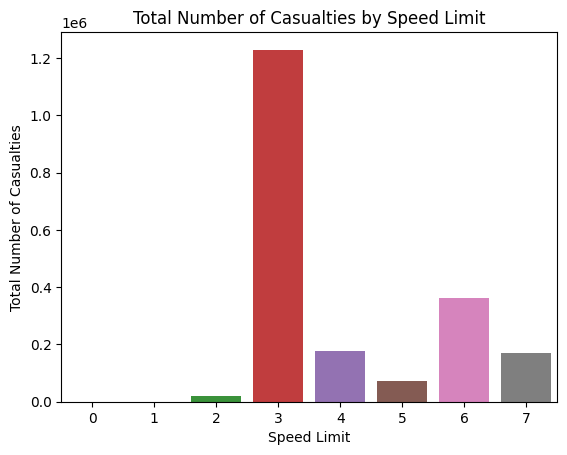

In [13]:
grouped_data = combined_df.groupby('Speed_limit')['Number_of_Casualties'].sum().reset_index()

# Create a bar plot
sns.barplot(data=grouped_data, x='Speed_limit', y='Number_of_Casualties')
plt.xlabel('Speed Limit')
plt.ylabel('Total Number of Casualties')
plt.title('Total Number of Casualties by Speed Limit')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


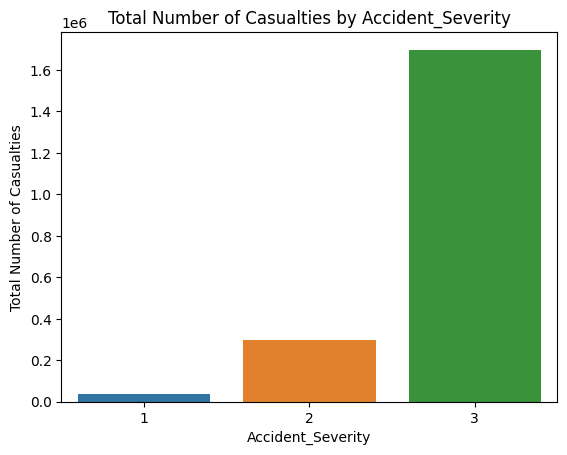

In [14]:
grouped_data = combined_df.groupby('Accident_Severity')['Number_of_Casualties'].sum().reset_index()

# Create a bar plot
sns.barplot(data=grouped_data, x='Accident_Severity', y='Number_of_Casualties')
plt.xlabel('Accident_Severity')
plt.ylabel('Total Number of Casualties')
plt.title('Total Number of Casualties by Accident_Severity')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


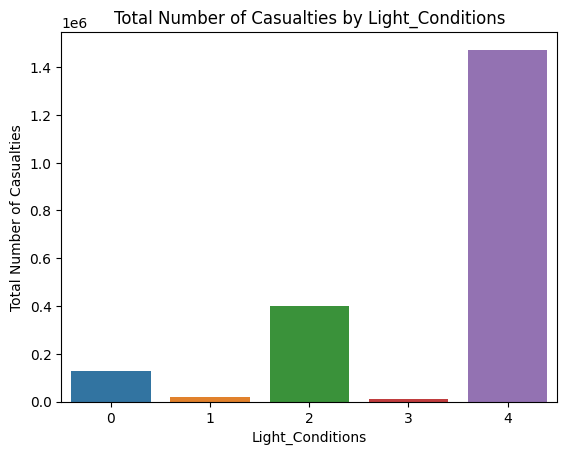

In [15]:
grouped_data = combined_df.groupby('Light_Conditions')['Number_of_Casualties'].sum().reset_index()

# Create a bar plot
sns.barplot(data=grouped_data, x='Light_Conditions', y='Number_of_Casualties')
plt.xlabel('Light_Conditions')
plt.ylabel('Total Number of Casualties')
plt.title('Total Number of Casualties by Light_Conditions')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


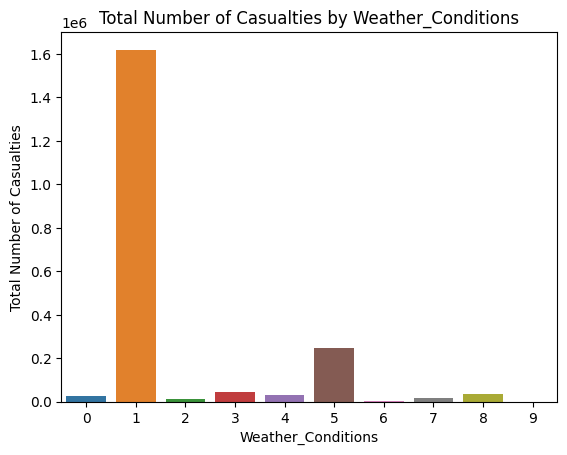

In [16]:
grouped_data = combined_df.groupby('Weather_Conditions')['Number_of_Casualties'].sum().reset_index()

# Create a bar plot
sns.barplot(data=grouped_data, x='Weather_Conditions', y='Number_of_Casualties')
plt.xlabel('Weather_Conditions')
plt.ylabel('Total Number of Casualties')
plt.title('Total Number of Casualties by Weather_Conditions')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

<Axes: xlabel='Accident_Severity', ylabel='Number_of_Casualties'>

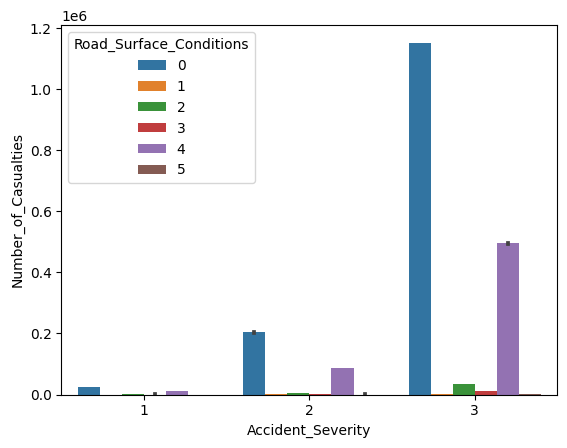

In [17]:
sns.barplot(data=combined_df, x='Accident_Severity', y='Number_of_Casualties', hue='Road_Surface_Conditions', estimator=sum)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

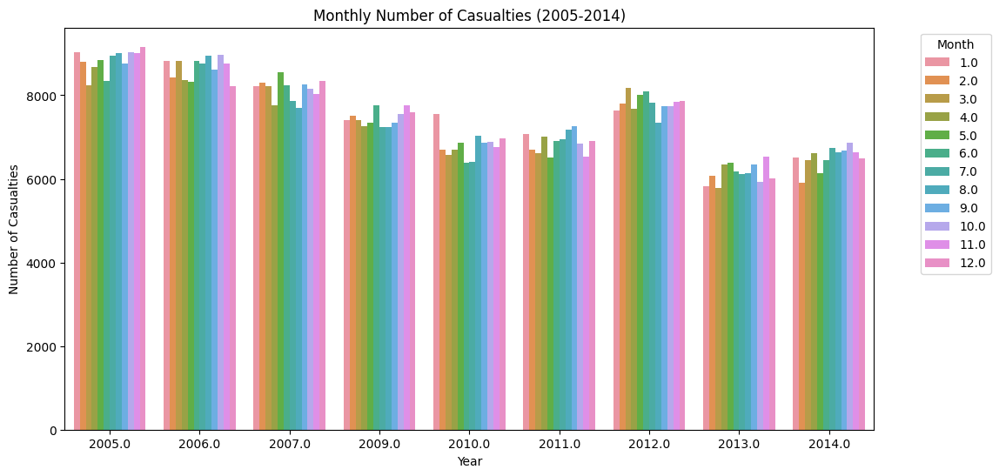

In [18]:
# Convert the 'Date' column to datetime format
combined_df['Date'] = pd.to_datetime(combined_df['Date'], errors='coerce')

# Extract the year and month from the 'Date' column
combined_df['Year'] = combined_df['Date'].dt.year
combined_df['Month'] = combined_df['Date'].dt.month

# Group by 'Year' and 'Month' and calculate the sum of 'Number_of_Casualties' for each month
monthly_casualties = combined_df.groupby(['Year', 'Month'])['Number_of_Casualties'].sum().reset_index()

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='Year', y='Number_of_Casualties', hue='Month', data=monthly_casualties , width = 0.8)
plt.title('Monthly Number of Casualties (2005-2014)')
plt.xlabel('Year')
plt.ylabel('Number of Casualties')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

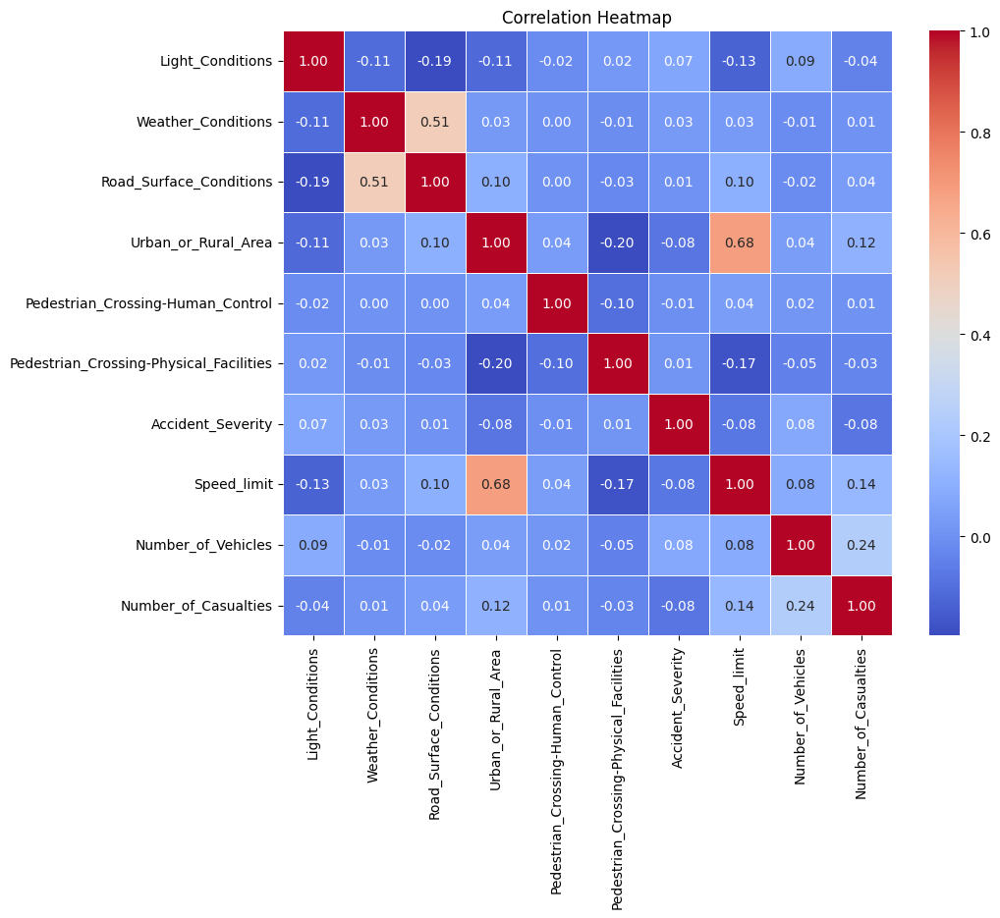

In [19]:
col_names = ['Light_Conditions','Weather_Conditions','Road_Surface_Conditions','Urban_or_Rural_Area','Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities','Accident_Severity','Speed_limit','Number_of_Vehicles','Number_of_Casualties']
# Extract the subset of columns
subset_df = combined_df[col_names]

# Compute the correlation matrix
correlation_matrix = subset_df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [21]:
X = combined_df[['Number_of_Vehicles', 'Accident_Severity','Road_Type', 'Speed_limit','Light_Conditions',
                 'Weather_Conditions', 'Road_Surface_Conditions']]
y = combined_df[['Number_of_Casualties']]

<h2>Modeling</h2>

In [25]:
# Evaluation Metrics
def evaluate_model(predictions, model_name):
    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions, average='weighted')
    recall = recall_score(y_test, predictions, average='weighted')
    f1 = f1_score(y_test, predictions, average='weighted')
    print(f"{model_name} Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, predictions)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{model_name} Confusion Matrix")
    plt.show()

<h1>Random Forest Classifier</h1>

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(

Random Forest Metrics:
Accuracy: 0.8504
Precision: 0.7730
Recall: 0.8504
F1-Score: 0.7844


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

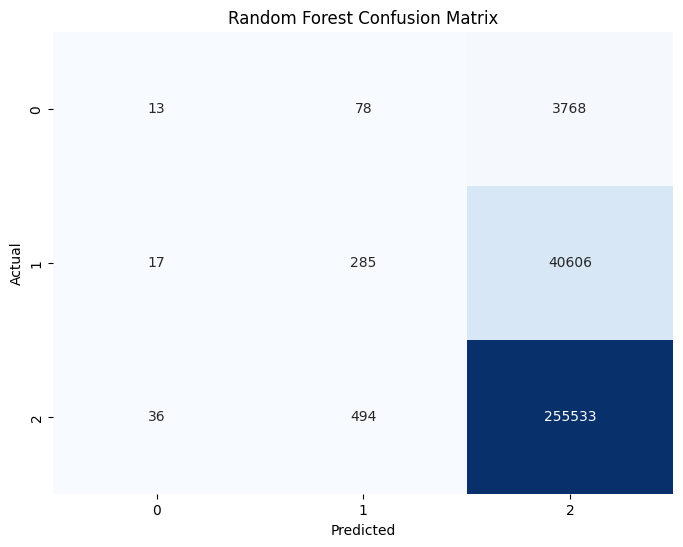

In [27]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score , accuracy_score


# Assuming combined_df is your DataFrame
X = combined_df[['Number_of_Vehicles', 'Number_of_Casualties', 'Road_Type', 'Speed_limit',
                  'Light_Conditions', 'Weather_Conditions', 'Road_Surface_Conditions']]
y = combined_df['Accident_Severity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# Predictions
rf_predictions = rf_classifier.predict(X_test)



# Evaluate Random Forest
evaluate_model(rf_predictions, "Random Forest")

<h1>KNeighborsClassifier</h1>

In [28]:
# K-Nearest Neighbors Classifier
knn_classifier = KNeighborsClassifier(n_neighbors=5)
knn_classifier.fit(X_train, y_train)

# Predictions
knn_predictions = knn_classifier.predict(X_test)


/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(

<h1>Evaluating KNN</h1>

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

K-Nearest Neighbors Metrics:
Accuracy: 0.7127
Precision: 0.7391
Recall: 0.7127
F1-Score: 0.7247


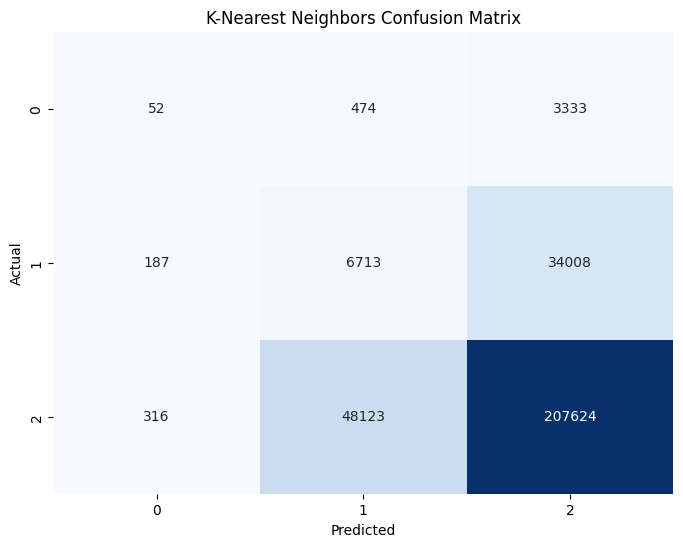

In [33]:
# Evaluate K-Nearest Neighbors
evaluate_model(knn_predictions, "K-Nearest Neighbors")